# Opening data

In [2]:
import os
from pbwrap.utils import open_image

dapi_folder = "/media/floricslimani/SSD4To/SSD_floricslimani/Fish_seq/Davide/2024-09-03 - SeqFISH_Run8 - HeLa_POLR2/DAPI_Z-stacks/"
im_name = "img000_000_000000_0000000000.ome.tif"

In [3]:
locations = os.listdir(dapi_folder)
locations.sort()
locations

['Location-01',
 'Location-02',
 'Location-03',
 'Location-04',
 'Location-05',
 'Location-06',
 'Location-07',
 'Location-08',
 'Location-09',
 'Location-10']

In [4]:
location = 1
dapi_path = dapi_folder + locations[location] + f"/{im_name}"

dapi_ref = open_image(dapi_path)
dapi_ref = dapi_ref[:,0] # Selecting dapi signal not beads
shape = dapi_ref.shape
dim = len(shape)

print("shape : ", dapi_ref.shape)
print("dim : ", dim)
print("dtype : ", dapi_ref.dtype)

shape :  (51, 2004, 2004)
dim :  3
dtype :  uint16


# Reference

In [5]:
import matplotlib.pyplot as plt
import numpy as np
from pbwrap.preprocessing.alignement import shift_array

In [6]:
SEED = 1
random_gen = np.random.default_rng(seed=SEED)

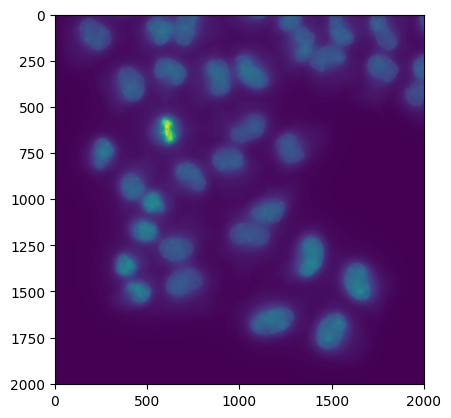

In [7]:
dapi_ref_max = np.max(dapi_ref,axis=0)
plt.imshow(dapi_ref_max)

# Augmenting data

In [8]:
Sample_size = 50
sample_list = [dapi_ref.copy() for i in range(Sample_size)]

## Translation

In [9]:
Z_amplitude = 3 #px
Y_amplitude = 10 #px
X_amplitude = 10 #px

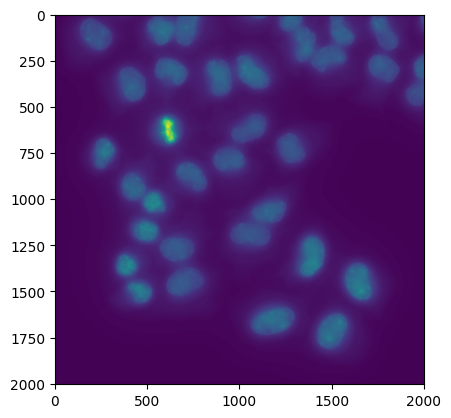

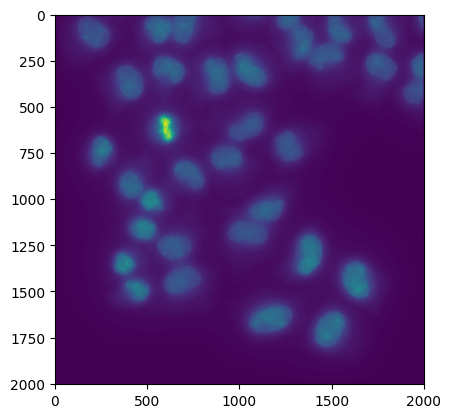

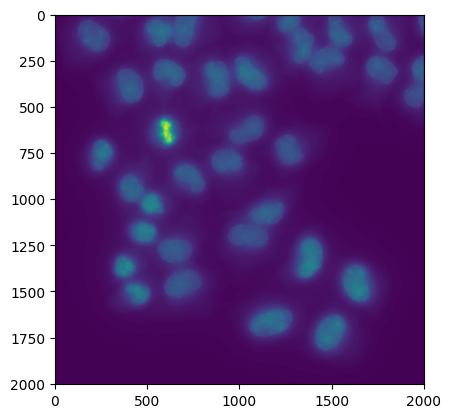

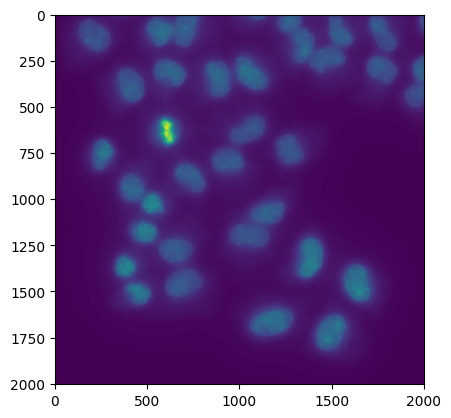

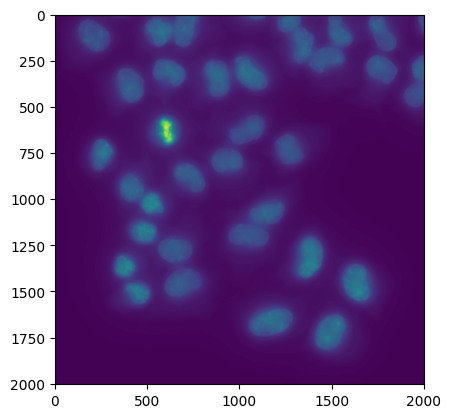

...

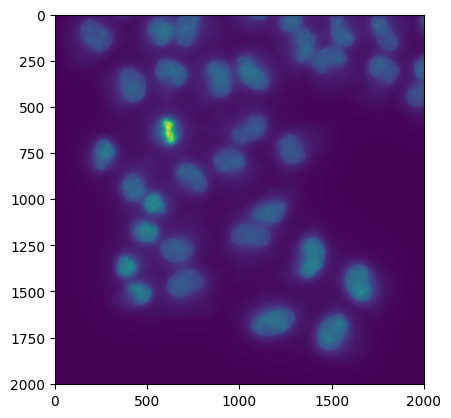

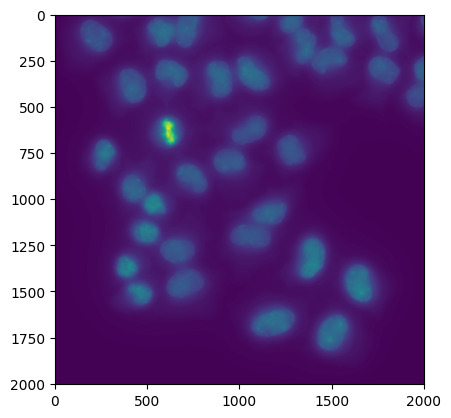

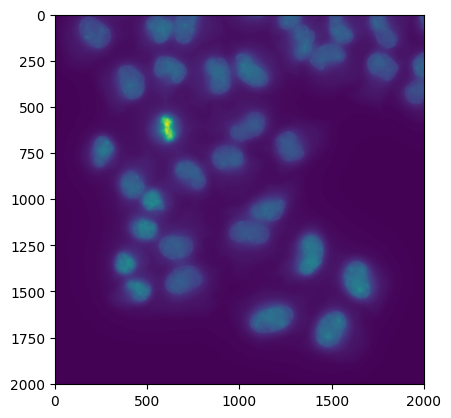

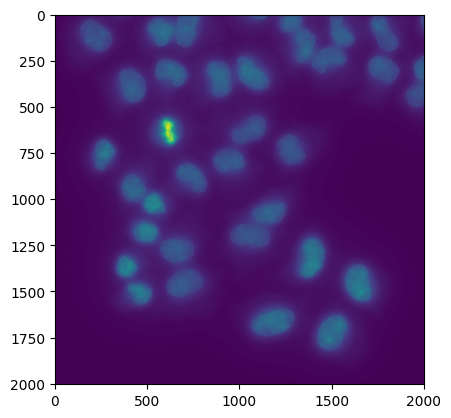

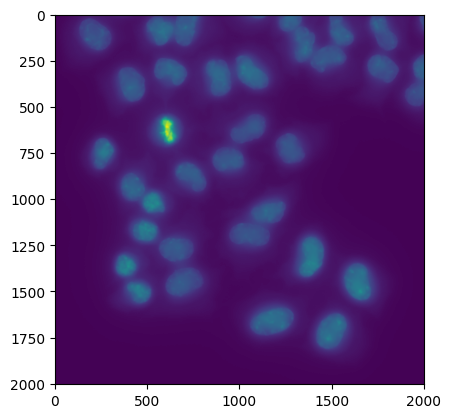

In [10]:
translation_list = []

for sample_idx in range(Sample_size) :
   
   translation = random_gen.integers(
      [-Z_amplitude, -Y_amplitude, -X_amplitude],
      [Z_amplitude, Y_amplitude, X_amplitude],
      )
   
   translation_list.append(translation)

   sample_list[sample_idx] = shift_array(sample_list[sample_idx], *translation)

   plt.figure()
   plt.imshow(np.max(sample_list[sample_idx], axis=0) )
   plt.show()

## Noise

In [11]:
noise_amplitude = dapi_ref.mean()*7
bleach_amplitude = 2

sample : 0


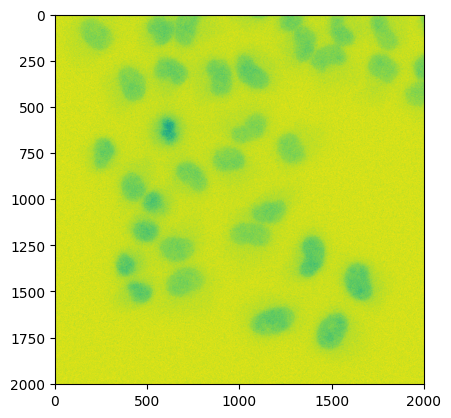

sample : 1


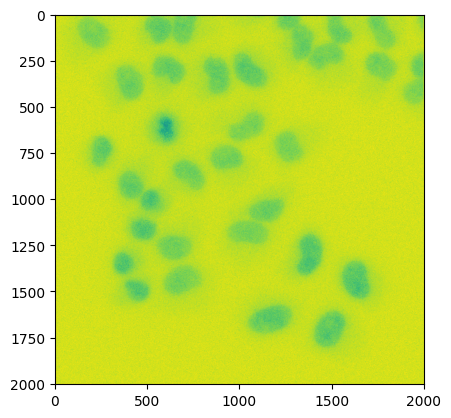

sample : 2


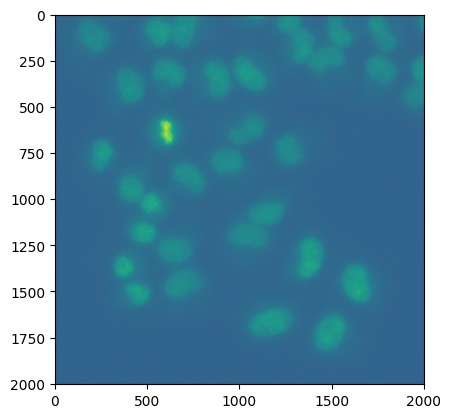

sample : 3


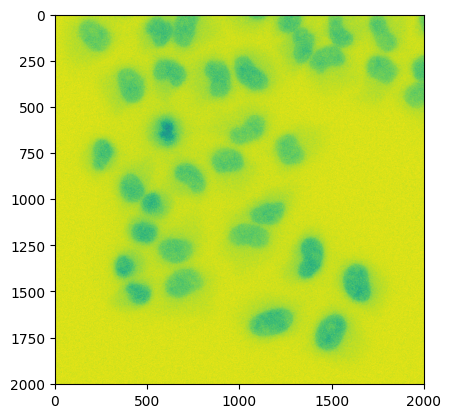

sample : 4


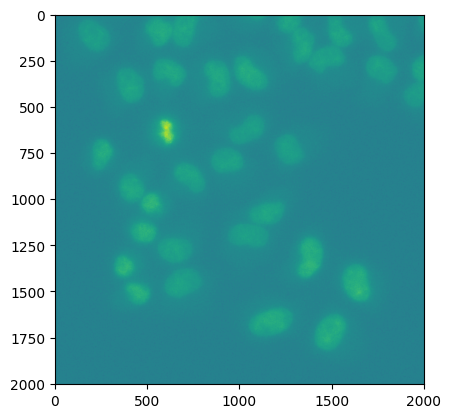

sample : 5


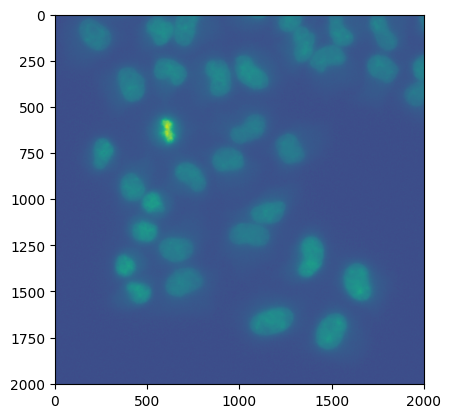

sample : 6


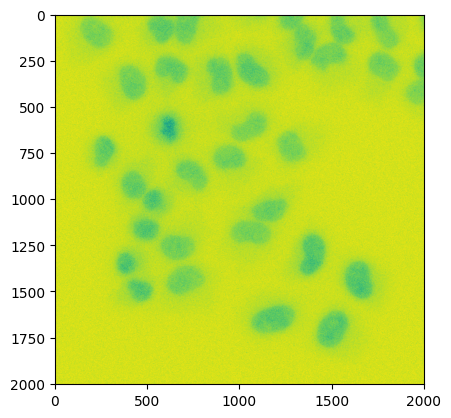

sample : 7


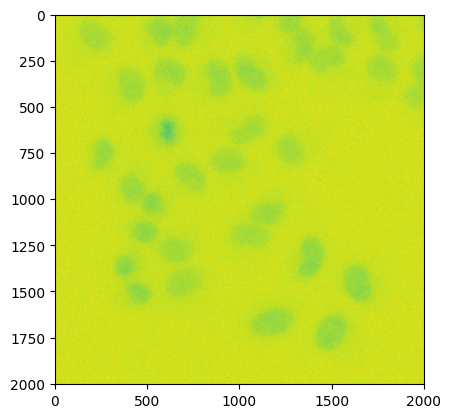

sample : 8


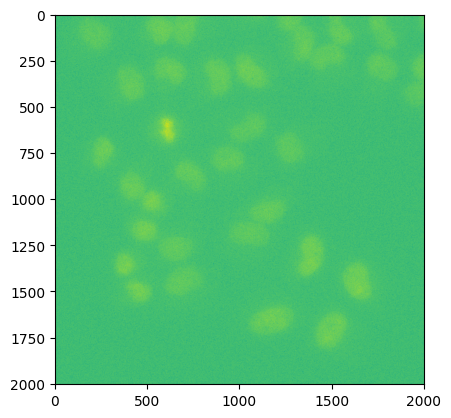

sample : 9


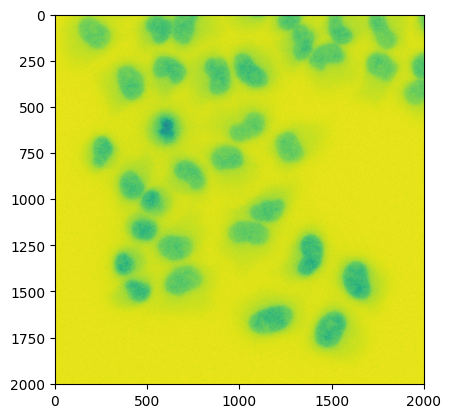

sample : 10


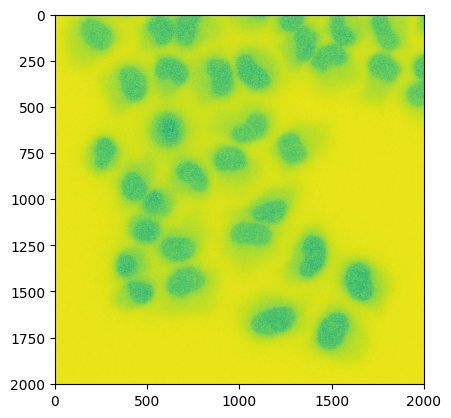

sample : 11


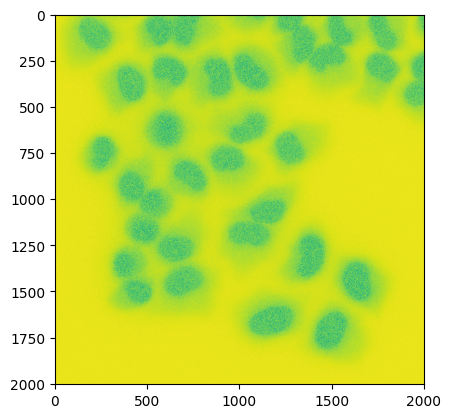

sample : 12


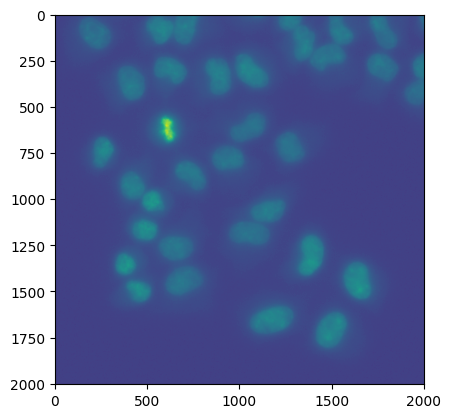

sample : 13


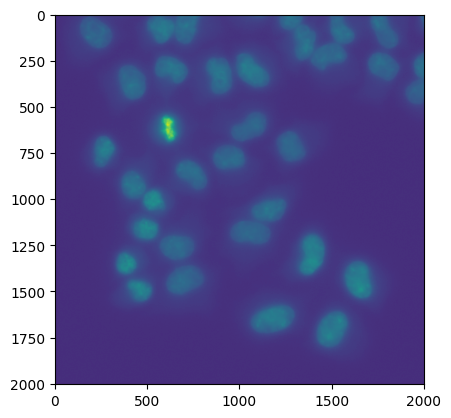

sample : 14


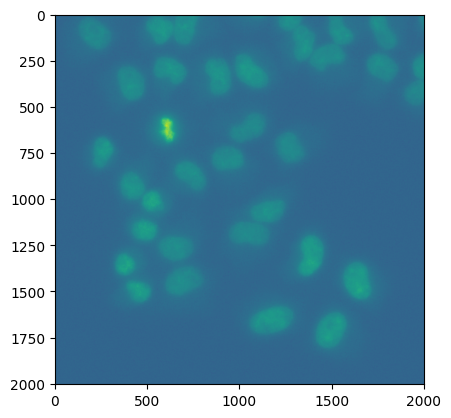

sample : 15


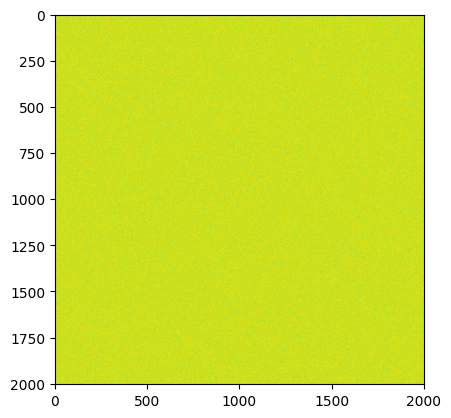

sample : 16


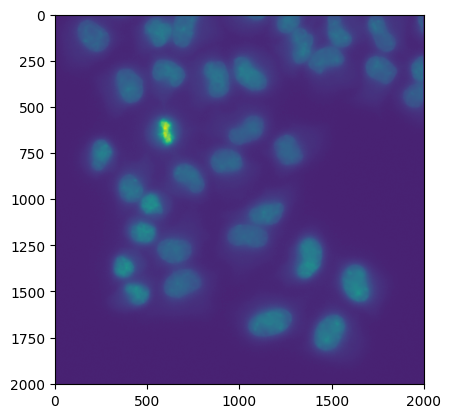

sample : 17


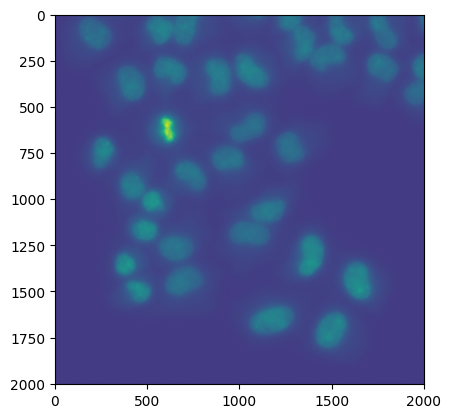

sample : 18


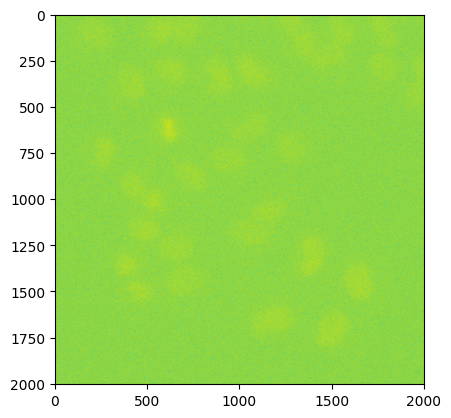

sample : 19


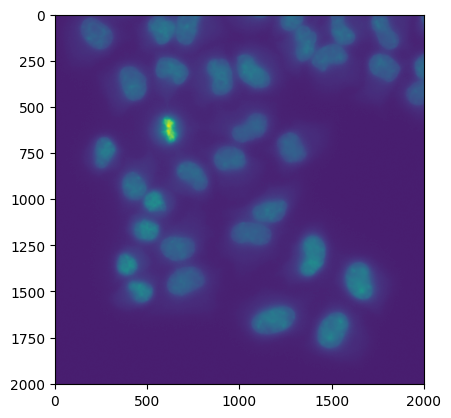

sample : 20


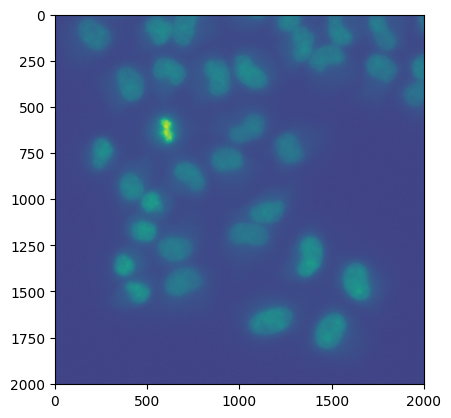

sample : 21


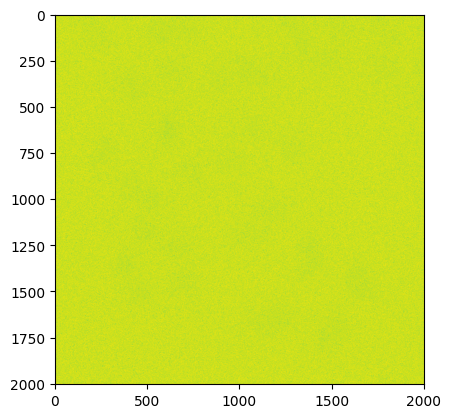

sample : 22


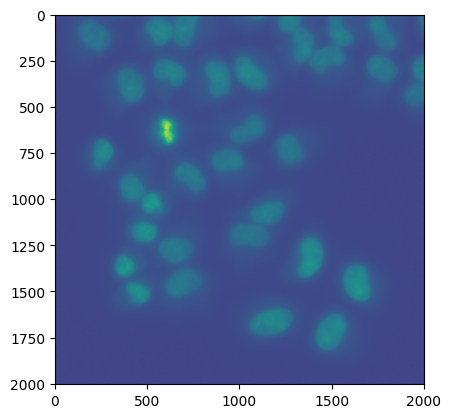

sample : 23


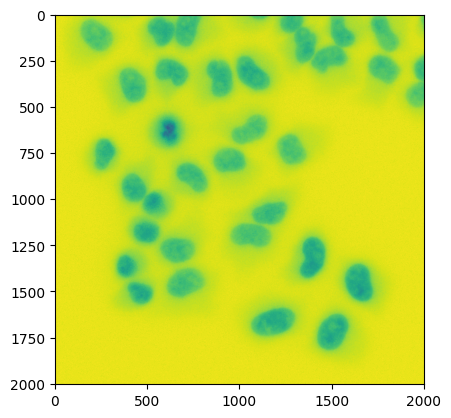

sample : 24


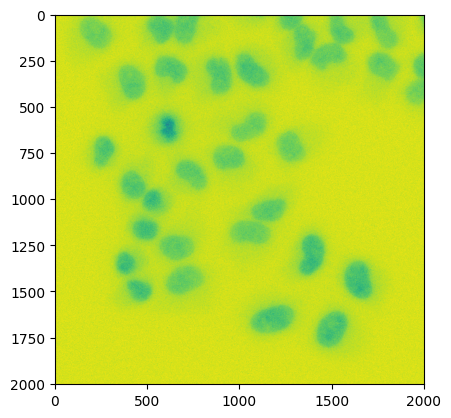

sample : 25


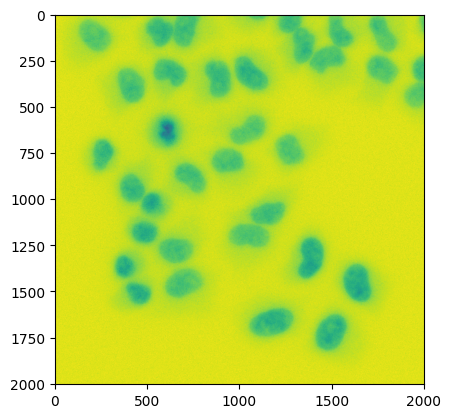

sample : 26


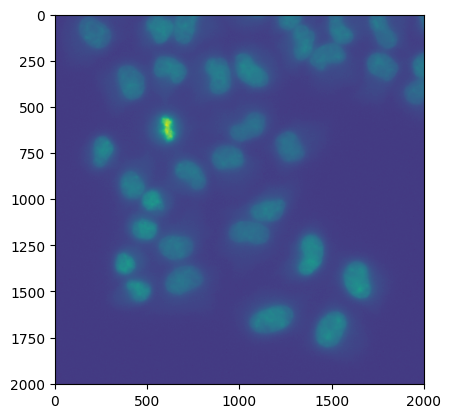

sample : 27


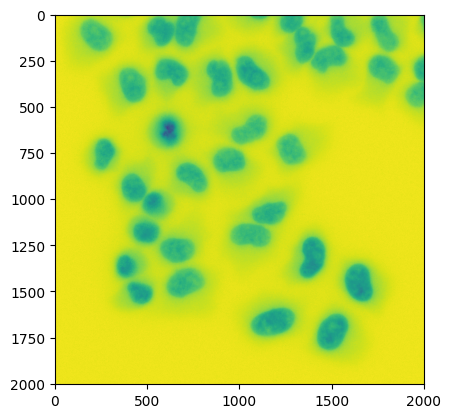

sample : 28


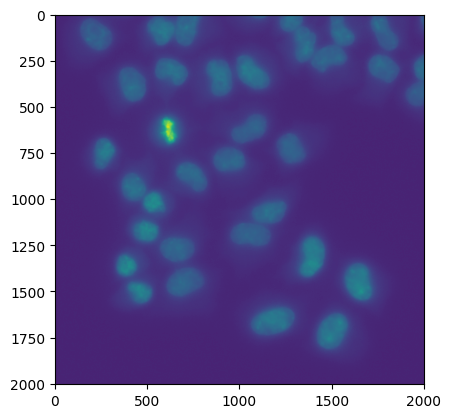

sample : 29


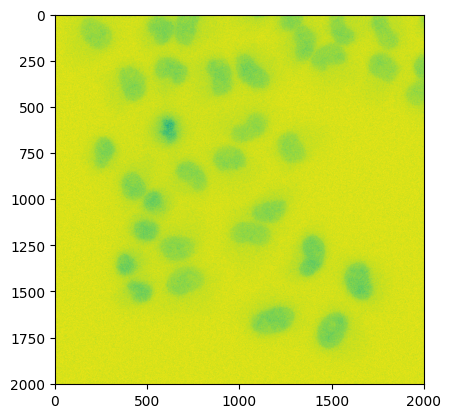

sample : 30


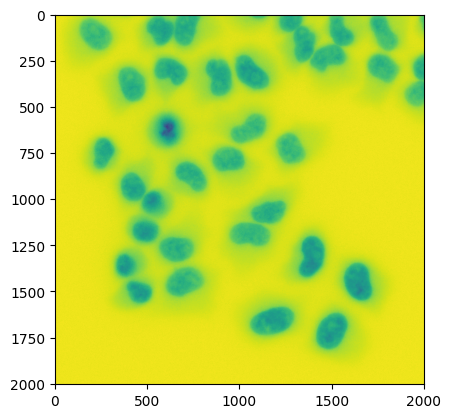

sample : 31


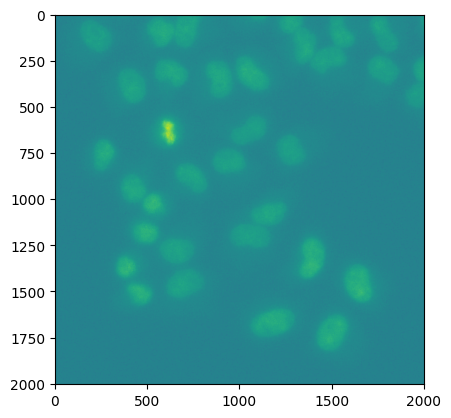

sample : 32


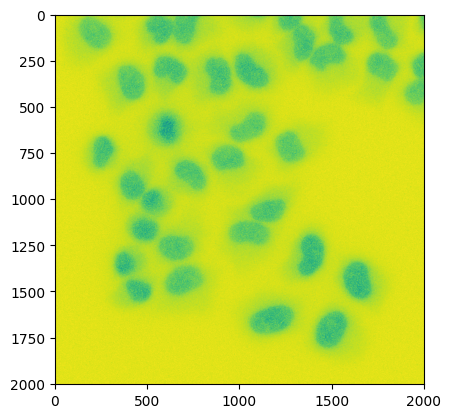

sample : 33


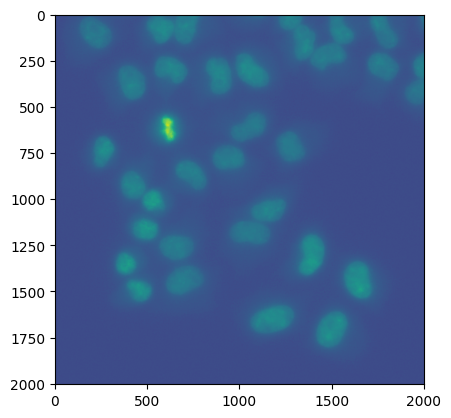

sample : 34


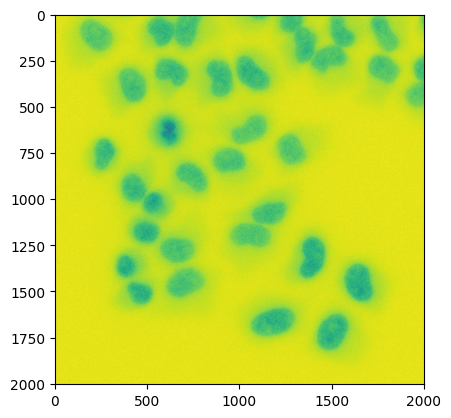

sample : 35


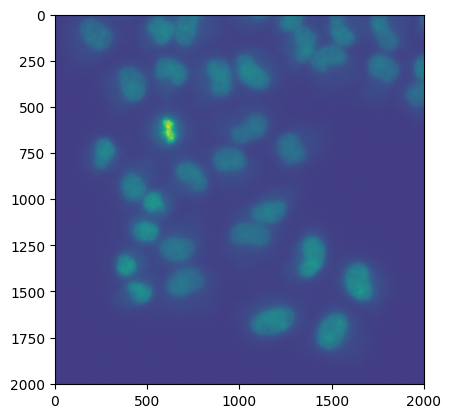

sample : 36


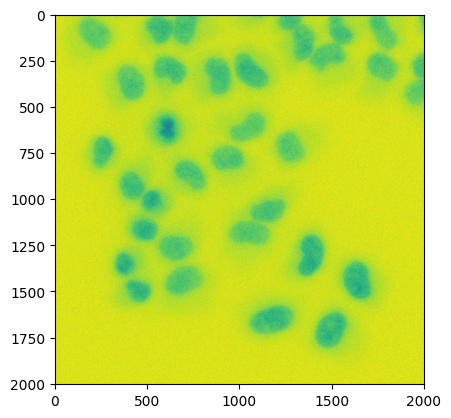

sample : 37


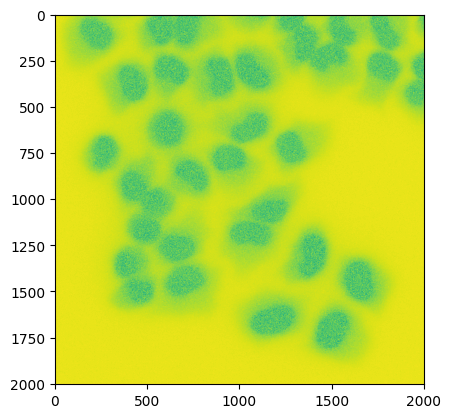

sample : 38


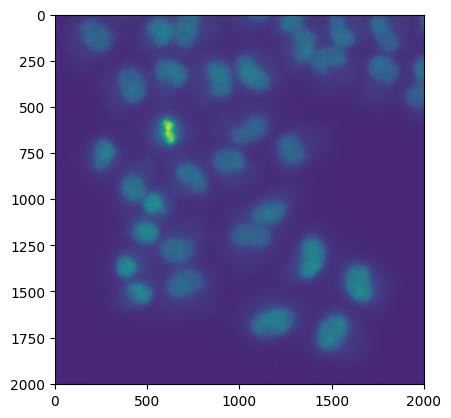

sample : 39


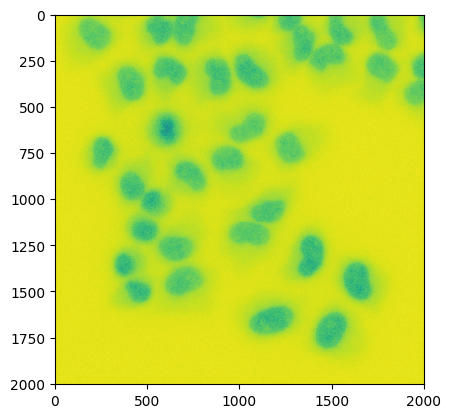

sample : 40


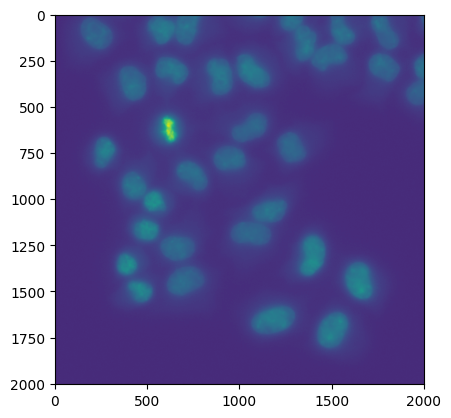

sample : 41


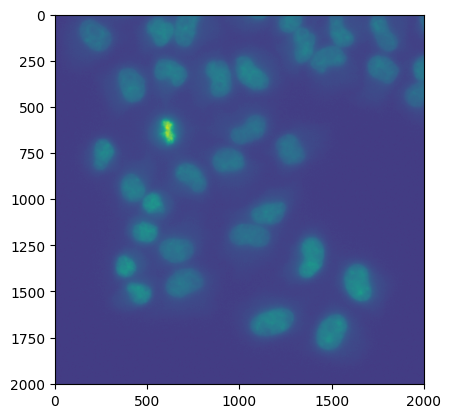

sample : 42


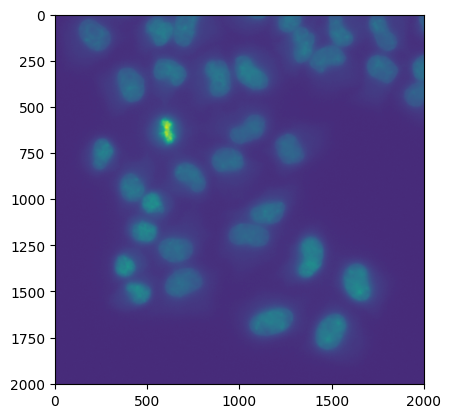

sample : 43


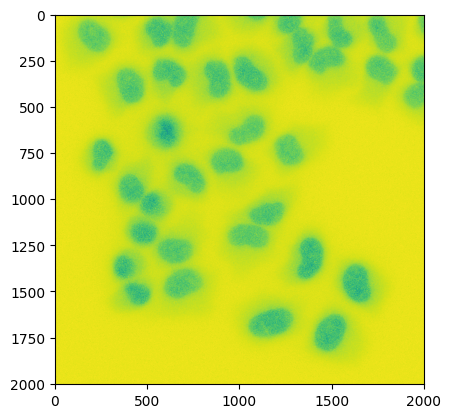

sample : 44


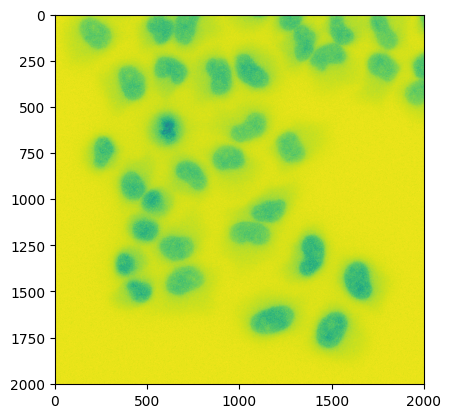

sample : 45


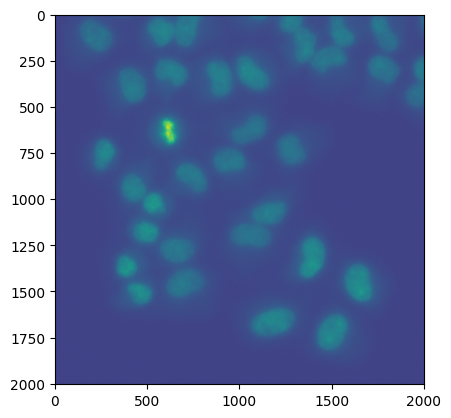

sample : 46


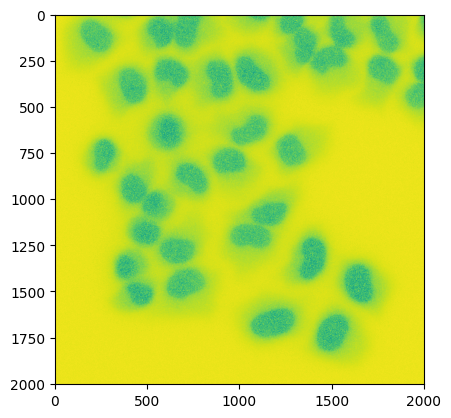

sample : 47


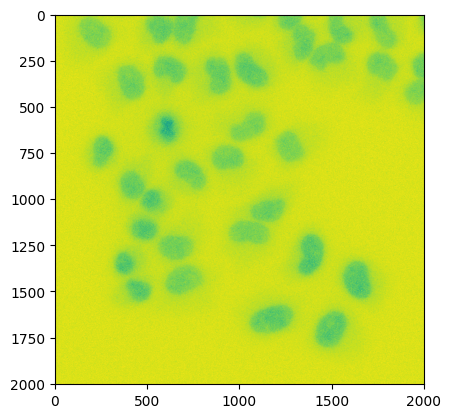

sample : 48


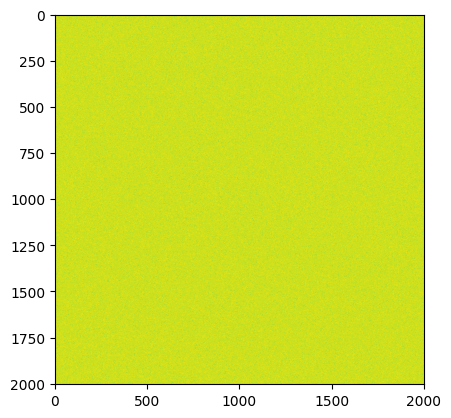

sample : 49


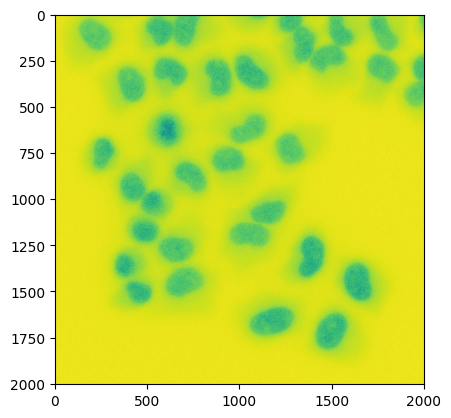

In [12]:
for sample_idx in range(Sample_size) :
    
    
    noise = random_gen.integers(-noise_amplitude, noise_amplitude, size=shape, dtype='int64')
    bleach = random_gen.normal(0)
    
    sample_list[sample_idx] = sample_list[sample_idx] * bleach
    sample_list[sample_idx] = np.add(sample_list[sample_idx], noise, casting="unsafe")
    print(f"sample : {sample_idx}")
    
    plt.figure()
    plt.imshow(np.max(sample_list[sample_idx], axis=0) )
    plt.show()

# Finding drift

can we find correct drift value with Fourier phase translation ?

In [13]:
from pbwrap.preprocessing.alignement import fft_phase_correlation_drift

**TODO : Check sucess rate from sucess_list** 

In [14]:
sucess_list = []

for sample_idx in range(len(sample_list)) :
    
    drift = fft_phase_correlation_drift(
        dapi_ref,
        sample_list[sample_idx],
        voxel_size=(1,1,1),
        bead_size=(1,1,1)
    )

    drift = (-drift['drift_z'][0], -drift['drift_y'][0], -drift['drift_x'][0])
    translation = tuple(translation_list[sample_idx])

    print(f"\nsampe_idx : {sample_idx}\nfound translation : {drift}\n actual translation : {translation}")
    sucess = drift == translation
    print(f"sucess : {sucess}")


sampe_idx : 0
found translation : (-1, 0, 5)
 actual translation : (-1, 0, 5)
sucess : True

sampe_idx : 1
found translation : (2, -10, -8)
 actual translation : (2, -10, -8)
sucess : True

sampe_idx : 2
found translation : (1, 8, -6)
 actual translation : (1, 8, -6)
sucess : True

sampe_idx : 3
found translation : (-2, 7, -2)
 actual translation : (-2, 7, -2)
sucess : True

sampe_idx : 4
found translation : (-2, 6, -5)
 actual translation : (-2, 6, -5)
sucess : True

sampe_idx : 5
found translation : (-1, 2, 0)
 actual translation : (-1, 2, 0)
sucess : True

sampe_idx : 6
found translation : (-3, -10, 7)
 actual translation : (-3, -10, 7)
sucess : True

sampe_idx : 7
found translation : (1, 6, 0)
 actual translation : (1, 6, 0)
sucess : True

sampe_idx : 8
found translation : (1, -4, -1)
 actual translation : (1, -4, -1)
sucess : True

sampe_idx : 9
found translation : (1, -8, -4)
 actual translation : (1, -8, -4)
sucess : True

sampe_idx : 10
found translation : (-3, -1, 9)
 actual 

: 